In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
from glob import glob
import cv2
from sklearn.decomposition import PCA
from tqdm.notebook import tqdm

## Read all files

- There's just a single sample in three different zoom levels: 20x, 40x and 60x.
- Each zoom level has seven input channels (brightfields) and three target channels (fluorescent). 

In [2]:
IMG_DIR = '../input/images_for_preview/'
IMG_20_DIR = os.path.join(IMG_DIR, '20x images')
IMG_40_DIR = os.path.join(IMG_DIR, '40x images')
IMG_60_DIR = os.path.join(IMG_DIR, '60x images')

In [3]:
input_files_20 = glob(IMG_20_DIR + '/input/*.tif')
input_files_40 = glob(IMG_40_DIR + '/input/*.tif')
input_files_60 = glob(IMG_60_DIR + '/input/*.tif')

target_files_20 = glob(IMG_20_DIR + '/targets/*.tif')
target_files_40 = glob(IMG_40_DIR + '/targets/*.tif')
target_files_60 = glob(IMG_60_DIR + '/targets/*.tif')

input_files_20, target_files_20

(['../input/images_for_preview/20x images/input/AssayPlate_Greiner_#655090_D04_T0001F006L01A04Z01C04.tif',
  '../input/images_for_preview/20x images/input/AssayPlate_Greiner_#655090_D04_T0001F006L01A04Z02C04.tif',
  '../input/images_for_preview/20x images/input/AssayPlate_Greiner_#655090_D04_T0001F006L01A04Z03C04.tif',
  '../input/images_for_preview/20x images/input/AssayPlate_Greiner_#655090_D04_T0001F006L01A04Z04C04.tif',
  '../input/images_for_preview/20x images/input/AssayPlate_Greiner_#655090_D04_T0001F006L01A04Z05C04.tif',
  '../input/images_for_preview/20x images/input/AssayPlate_Greiner_#655090_D04_T0001F006L01A04Z06C04.tif',
  '../input/images_for_preview/20x images/input/AssayPlate_Greiner_#655090_D04_T0001F006L01A04Z07C04.tif'],
 ['../input/images_for_preview/20x images/targets/AssayPlate_Greiner_#655090_D04_T0001F006L01A01Z01C01.tif',
  '../input/images_for_preview/20x images/targets/AssayPlate_Greiner_#655090_D04_T0001F006L01A02Z01C02.tif',
  '../input/images_for_preview/2

### Plot image channels separately

Input channels for zoom level: 20


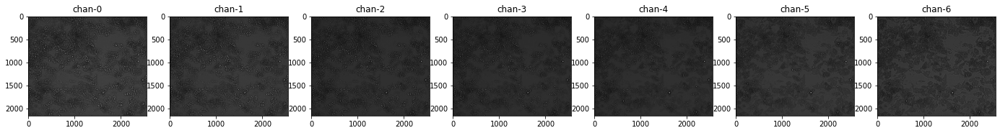

Input channels for zoom level: 40


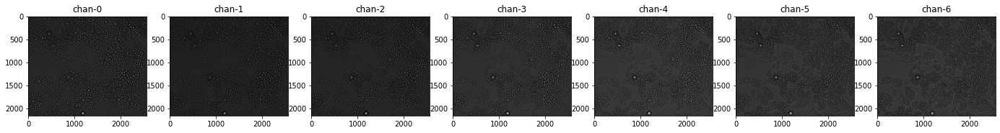

Input channels for zoom level: 60


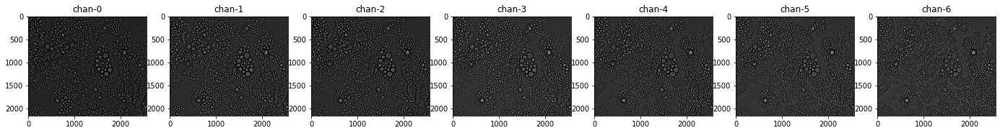

Target channels for zoom level: 20


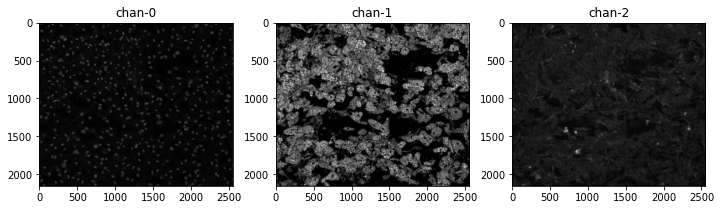

Target channels for zoom level: 40


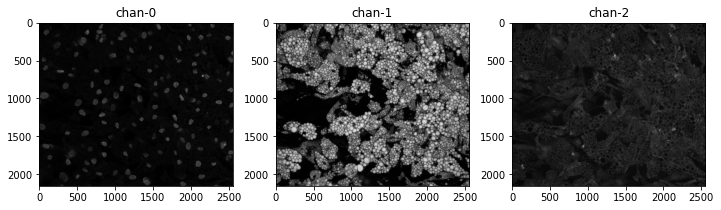

Target channels for zoom level: 60


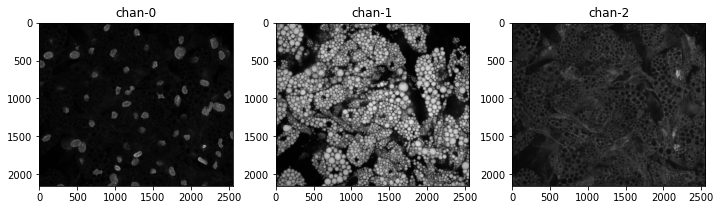

In [4]:
def plot_channels_separately(fns, size_factor=3):
    f, axs = plt.subplots(1, len(fns), figsize=((1 + len(fns))*size_factor, size_factor))
    for i, (ax, fn) in enumerate(zip(axs, fns)):
        ax.imshow(plt.imread(fn), cmap='gray')
        ax.set_title(f'chan-{i}')
    plt.show()

for input_files, size_text in zip([input_files_20, input_files_40, input_files_60], ['20','40','60']):
    print(f'Input channels for zoom level: {size_text}')
    plot_channels_separately(input_files)
    
for target_files, size_text in zip([target_files_20, target_files_40, target_files_60], ['20','40','60']):
    print(f'Target channels for zoom level: {size_text}')
    plot_channels_separately(target_files)

### RGB visualizations

In [10]:
def plot_channels_rgb(fns):
    rgb_fns = fns[:3]
    rgb = np.stack([cv2.imread(fn, cv2.IMREAD_UNCHANGED) for fn in rgb_fns], axis=2)
    maxs = []
    for i, col in enumerate(['r','g','b']):
        maxs.append(np.percentile(rgb[:,:,i], 98))
        print(f'{col} : max value = {rgb[:,:,i].max()}, 98th percentile {maxs[-1]}')
    rgb = np.clip(rgb / np.array(maxs), 0, 1.0).astype(np.float32)
    f, ax = plt.subplots(1,1,figsize=(10,10))
    ax.imshow(rgb)
    plt.show()

Three first input channels for zoom level: 20
r : max value = 11154, 98th percentile 4418.0
g : max value = 12328, 98th percentile 5158.0
b : max value = 14835, 98th percentile 5823.0


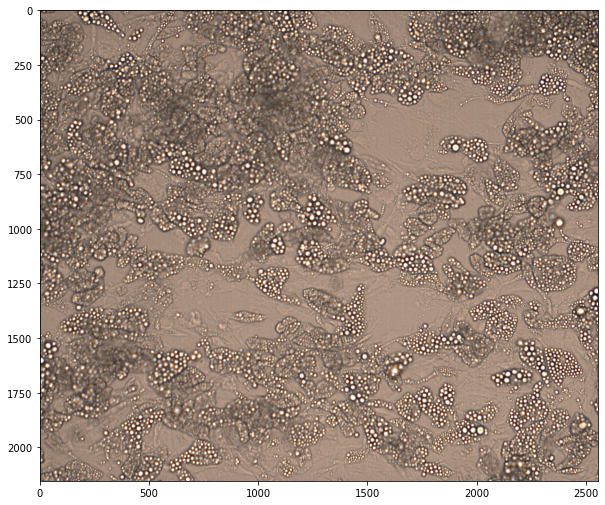

Three first input channels for zoom level: 40
r : max value = 4514, 98th percentile 1629.0
g : max value = 5375, 98th percentile 1587.0
b : max value = 4747, 98th percentile 1552.0


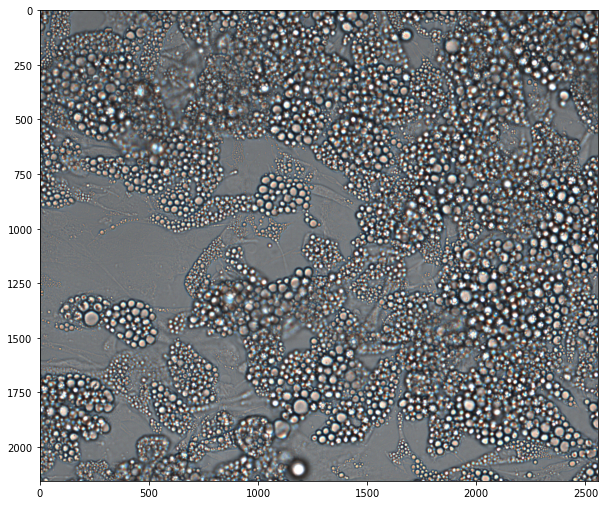

Three first input channels for zoom level: 60
r : max value = 3577, 98th percentile 1294.0
g : max value = 3087, 98th percentile 1281.0
b : max value = 3033, 98th percentile 1260.0


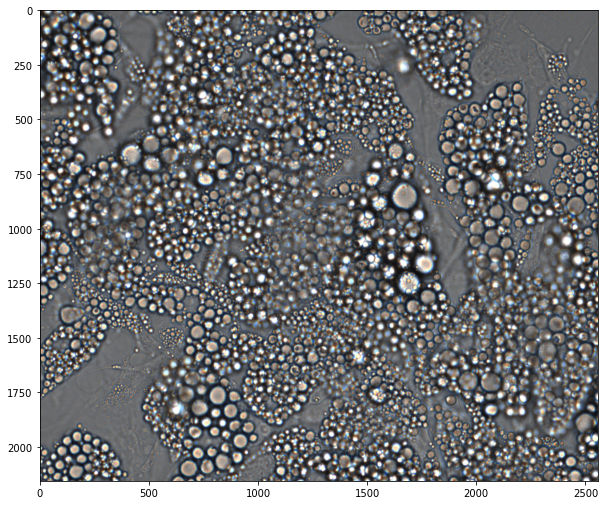

Target channels for zoom level: 20
r : max value = 10270, 98th percentile 2363.0
g : max value = 3200, 98th percentile 2193.0
b : max value = 6281, 98th percentile 1327.0


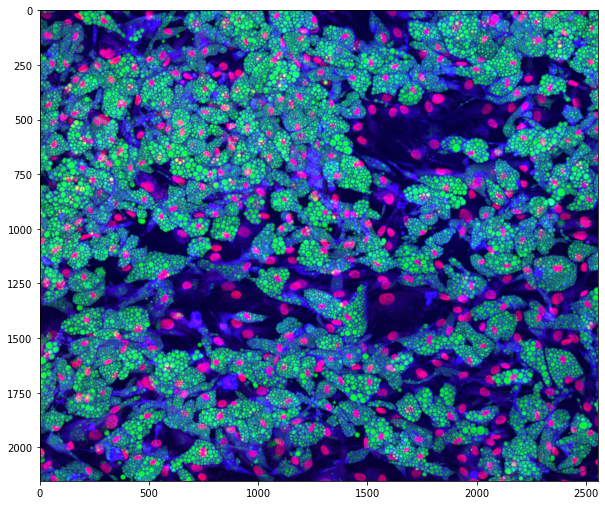

Target channels for zoom level: 40
r : max value = 10338, 98th percentile 2328.0
g : max value = 2431, 98th percentile 1862.0
b : max value = 3181, 98th percentile 769.0


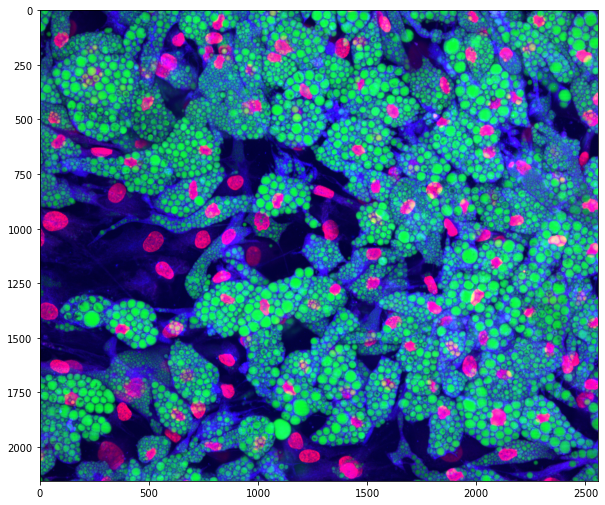

Target channels for zoom level: 60
r : max value = 6209, 98th percentile 1914.0
g : max value = 4606, 98th percentile 3584.0
b : max value = 2201, 98th percentile 640.0


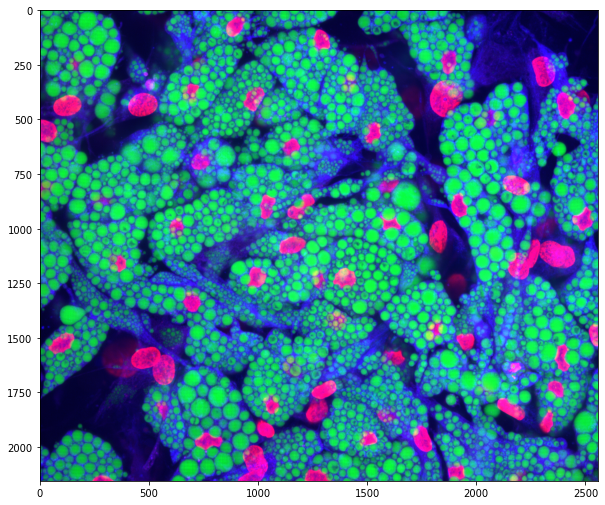

In [11]:
for input_files, size_text in zip([input_files_20, input_files_40, input_files_60], ['20','40','60']):
    print(f'Three first input channels for zoom level: {size_text}')
    plot_channels_rgb(input_files)
    
for target_files, size_text in zip([target_files_20, target_files_40, target_files_60], ['20','40','60']):
    print(f'Target channels for zoom level: {size_text}')
    plot_channels_rgb(target_files)

### PCA dimensionality reduction

Try reducing 7 brightfield image channels to 3 RGB components. 

In [4]:
X = np.stack([cv2.imread(fn, cv2.IMREAD_UNCHANGED) for fn in input_files_60], axis=2).reshape(-1, len(input_files_20))
X.shape

(5510736, 7)

In [5]:
pca = PCA(n_components=3)
pca.fit(X)

PCA(n_components=3)

In [6]:
print(pca.explained_variance_ratio_.sum())

0.9639847067158661


In [7]:
pca.transform(X).shape

(5510736, 3)

In [58]:
def create_pca_rgb(fns, pcs):
    chans = np.stack([cv2.imread(fn, cv2.IMREAD_UNCHANGED) for fn in fns], axis=2)
    h,w,c = chans.shape
    chans = chans.reshape(-1, c)
    rgb = pca.transform(chans)
    rgb = rgb.reshape(h,w,-1)
    return rgb

def plot_input_pca(fns, pca):
    rgb = create_pca_rgb(fns, pca)
    maxs = []
    for i, col in enumerate(['r','g','b']):
        maxs.append(np.percentile(rgb[:,:,i], 98))
        print(f'{col} : max value = {rgb[:,:,i].max()}, 98th percentile {maxs[-1]}')
    rgb = np.clip(rgb / np.array(maxs), 0, 1.0).astype(np.float32)
    plt.imshow(rgb)
    plt.show()

PCA dimensionality reduction of input channels for zoom level: 20
r : max value = 23780.545687828904, 98th percentile 10163.825517651208
g : max value = 9353.978238981723, 98th percentile 2866.799477426055
b : max value = 8194.558998738923, 98th percentile 1691.159396189943


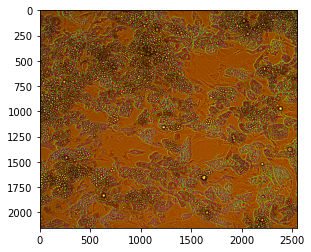

PCA dimensionality reduction of input channels for zoom level: 40
r : max value = 6978.7422853676035, 98th percentile 2156.815495916143
g : max value = 3135.3217354535136, 98th percentile 778.6338303131708
b : max value = 1796.4815909456968, 98th percentile 370.8644443332995


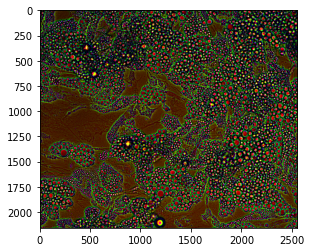

PCA dimensionality reduction of input channels for zoom level: 60
r : max value = 4180.498867711424, 98th percentile 1541.9284502536484
g : max value = 2142.317323833468, 98th percentile 635.9473166481941
b : max value = 1406.825961476693, 98th percentile 325.0037694001159


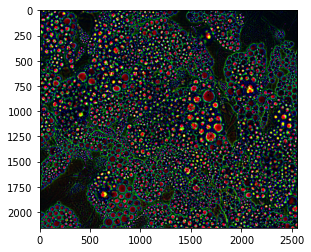

In [59]:
for input_files, size_text in zip([input_files_20, input_files_40, input_files_60], ['20','40','60']):
    print(f'PCA dimensionality reduction of input channels for zoom level: {size_text}')
    plot_input_pca(input_files, pca)

### Loss for prediction

In [10]:
from sklearn.metrics import mean_squared_error

def loss(true, pred):
    if len(true.shape) > 2:
        return np.array([mean_squared_error(x, y) for x,y in zip(true, pred)]).mean()
         
    else:
        return mean_squared_error(true, pred)

In [11]:
pca_rgb = create_pca_rgb(input_files_60, pca)
target_0 = np.stack([cv2.imread(fn, cv2.IMREAD_UNCHANGED) for fn in target_files_60], axis=2)
loss(pca_rgb, target_0)

1545468.76767009

### Baseline model

- Unet
- Split large images to smaller tiles to get a small set

In [12]:
h,w,_ = pca_rgb.shape

In [4]:
sz = 128

In [13]:
n_samples = (h//sz) * (w//sz)
print(f'number of samples from image: {n_samples}')

number of samples from image: 304


Generate data

In [60]:
for (input_files, target_files, size_text) in tqdm(zip(
    [input_files_20, input_files_40, input_files_60],
    [target_files_20, target_files_40, target_files_60],
    ['20','40','60'])
    ):
    input_dir = os.path.join('../input/small_set', f'input_pca_{size_text}_{sz}')
    target_dir = os.path.join('../input/small_set', f'target_{size_text}_{sz}')
    
    if not os.path.isdir(input_dir):
        os.mkdir(input_dir)
        
    if not os.path.isdir(target_dir):
        os.mkdir(target_dir)
    
    # get images
    pca_rgb = create_pca_rgb(input_files, pca).astype(np.uint16)
    target = np.stack([cv2.imread(fn, cv2.IMREAD_UNCHANGED) for fn in target_files], axis=2).astype(np.uint16)
    
    # normalize pca to uint8
    pca_rgb = (255*np.clip(target / np.array([2000,800,400]),0,1.0)).astype(np.uint8)
    
    # normalize target to uint8
    target = (255*np.clip(target / np.array([2000,2000,1000]),0,1.0)).astype(np.uint8)
    
    # split to tiles and save
    h,w,_ = pca_rgb.shape
    ind = 0
    for x in range(0, w, sz):
        if x > w-sz: continue
        for y in range(0, h, sz):
            if y > h-sz: continue
            ind += 1
            tile_input = pca_rgb[y:y+sz,x:x+sz,:]
            tile_target = target[y:y+sz,x:x+sz,:]
            
            # save
            cv2.imwrite(os.path.join(input_dir, f'{ind}.png'), tile_input)
            cv2.imwrite(os.path.join(target_dir, f'{ind}.png'), tile_target)

### Fastai unet

In [4]:
from fastai.vision.all import *

In [5]:
input_dir = '../input/small_set/input_pca_60_128/'
target_dir = '../input/small_set/target_60_128/'

fnames = get_image_files(input_dir)

def label_func(x): return os.path.join(target_dir, f'{x.stem}{x.suffix}')
    
#dls = SegmentationDataLoaders.from_label_func('.', fnames, label_func, bs=16)

In [6]:
def get_xy_files(path):
    files = get_image_files(input_dir)
    targets = get_image_files(target_dir)
    return [[x,y] for x,y in zip(files, targets)]

def get_x(t): return t[0]
def get_y(t): return t[1]

dblock = DataBlock(blocks = (ImageBlock, ImageBlock),
                   get_items=get_xy_files,
                   get_x=get_x, get_y=get_y,
                   splitter = RandomSplitter(),
                   item_tfms=[],)
                   #batch_tfms = Normalize.from_stats(torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])))
dls = dblock.dataloaders('.', path='.', bs=4)

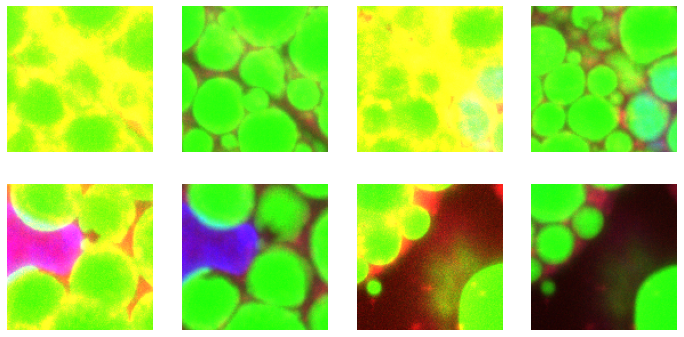

In [7]:
dls.show_batch()

In [8]:
xs, ys = dls.one_batch()

In [9]:
from fastai.vision import models

In [67]:
learn = unet_learner(dls, models.resnet34, n_out=3, loss_func=MSELossFlat(axis=1))

SuggestedLRs(lr_min=0.001096478197723627, lr_steep=0.00010964782268274575)

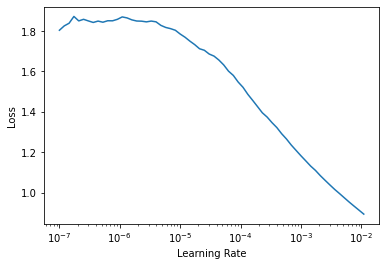

In [68]:
learn.lr_find()

In [69]:
learn.fine_tune(8, base_lr=1e-3)

epoch,train_loss,valid_loss,time
0,1.001523,0.478247,00:03


epoch,train_loss,valid_loss,time
0,0.278623,0.198239,00:03
1,0.225073,0.186366,00:03
2,0.200799,0.125891,00:03
3,0.181044,0.109493,00:03
4,0.163713,0.116758,00:03
5,0.148896,0.099060,00:03
6,0.135363,0.092450,00:03
7,0.124602,0.091103,00:04


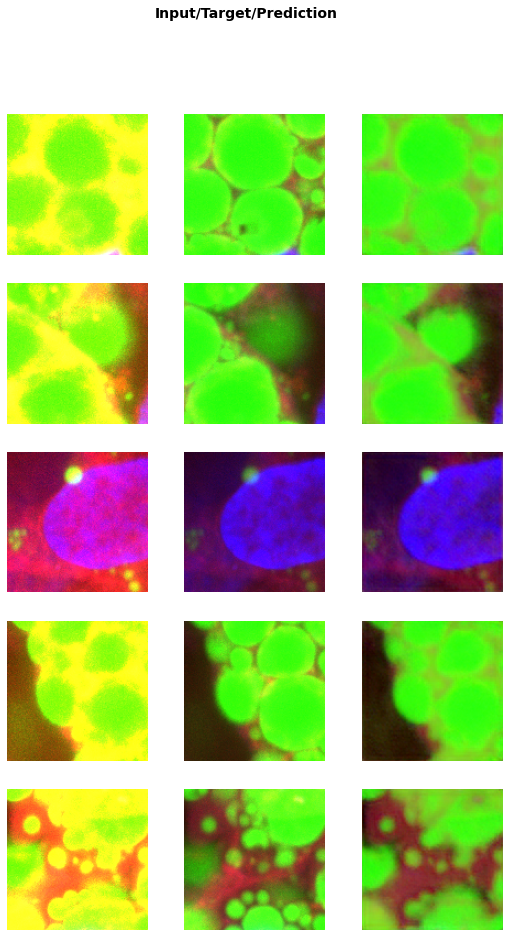

In [70]:
learn.show_results()

In [73]:
learn.fit_flat_cos(10, lr=1e-4)

epoch,train_loss,valid_loss,time
0,0.097987,0.101895,00:03
1,0.092164,0.085556,00:03
2,0.086818,0.088654,00:03
3,0.083290,0.083575,00:03
4,0.078939,0.080930,00:03
5,0.075409,0.081257,00:03
6,0.073246,0.084686,00:03
7,0.070420,0.086421,00:03
8,0.067672,0.079361,00:03
9,0.065048,0.078111,00:03


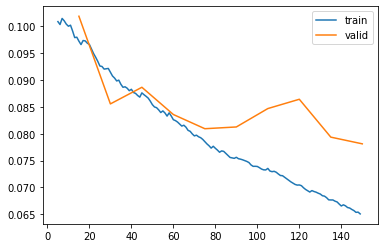

In [75]:
learn.recorder.plot_loss()

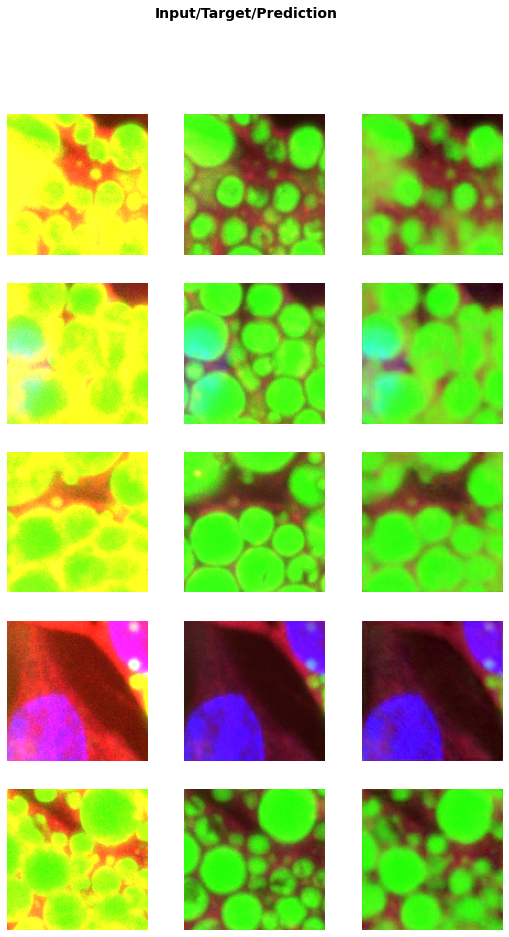

In [76]:
learn.show_results()

In [71]:
pred_img, raw, prob = learn.predict('../input/small_set/input_pca_60_128/1.png')

<AxesSubplot:>

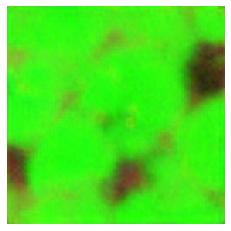

In [72]:
pred_img.show()

### Fix blur and make the edges stand out

### Perceptual loss

In [11]:
import torch
import torchvision

class VGGPerceptualLoss(torch.nn.Module):
    def __init__(self, resize=True):
        super(VGGPerceptualLoss, self).__init__()
        blocks = []
        blocks.append(torchvision.models.vgg16(pretrained=True).features[:4].eval())
        blocks.append(torchvision.models.vgg16(pretrained=True).features[4:9].eval())
        blocks.append(torchvision.models.vgg16(pretrained=True).features[9:16].eval())
        blocks.append(torchvision.models.vgg16(pretrained=True).features[16:23].eval())
        for bl in blocks:
            for p in bl:
                p.requires_grad = False
        self.blocks = torch.nn.ModuleList(blocks).cuda()
        self.transform = torch.nn.functional.interpolate
        self.mean = torch.nn.Parameter(torch.tensor([0.485, 0.456, 0.406]).view(1,3,1,1)).cuda()
        self.std = torch.nn.Parameter(torch.tensor([0.229, 0.224, 0.225]).view(1,3,1,1)).cuda()
        self.resize = resize

    def forward(self, input, target):
        if input.shape[1] != 3:
            input = input.repeat(1, 3, 1, 1)
            target = target.repeat(1, 3, 1, 1)
        input = (input-self.mean) / self.std
        target = (target-self.mean) / self.std
        if self.resize:
            input = self.transform(input, mode='bilinear', size=(224, 224), align_corners=False)
            target = self.transform(target, mode='bilinear', size=(224, 224), align_corners=False)
        loss = 0.0
        x = input
        y = target
        for block in self.blocks:
            x = block(x)
            y = block(y)
            loss += torch.nn.functional.l1_loss(x, y)
        return loss

In [11]:
learn = unet_learner(
    dls, 
    models.resnet34, 
    n_out=3, 
    loss_func=VGGPerceptualLoss()#MSELossFlat(axis=1)
)

SuggestedLRs(lr_min=0.002754228748381138, lr_steep=2.290867567062378)

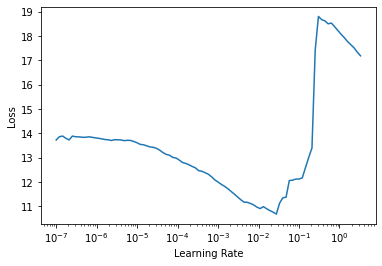

In [12]:
learn.lr_find()

In [13]:
learn.fine_tune(8, base_lr=1e-3)

epoch,train_loss,valid_loss,time
0,9.840259,8.102609,00:13


epoch,train_loss,valid_loss,time
0,6.983631,6.350426,00:13
1,6.599751,6.353335,00:13
2,6.229215,5.796388,00:13
3,5.890563,5.245682,00:13
4,5.538521,5.109769,00:13
5,5.218438,4.973286,00:13
6,4.946922,4.904740,00:13
7,4.740561,4.911135,00:13


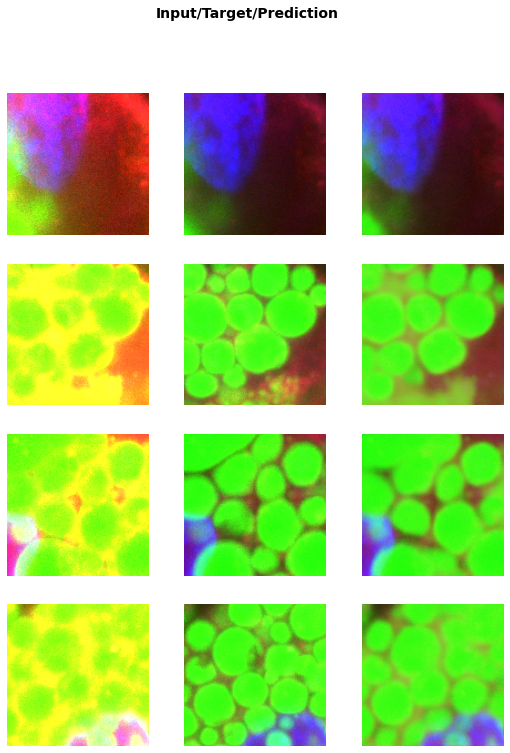

In [14]:
learn.show_results()

In [15]:
learn.fit_flat_cos(10, lr=1e-4)

epoch,train_loss,valid_loss,time
0,4.523400,4.947909,00:13
1,4.405034,5.066123,00:13
2,4.268726,4.981711,00:13
3,4.178219,4.910697,00:13
4,4.080014,4.967358,00:13
5,3.964355,4.866289,00:13
6,3.857026,4.926785,00:13
7,3.754034,4.807675,00:13
8,3.686474,4.840741,00:13
9,3.585190,4.911258,00:13


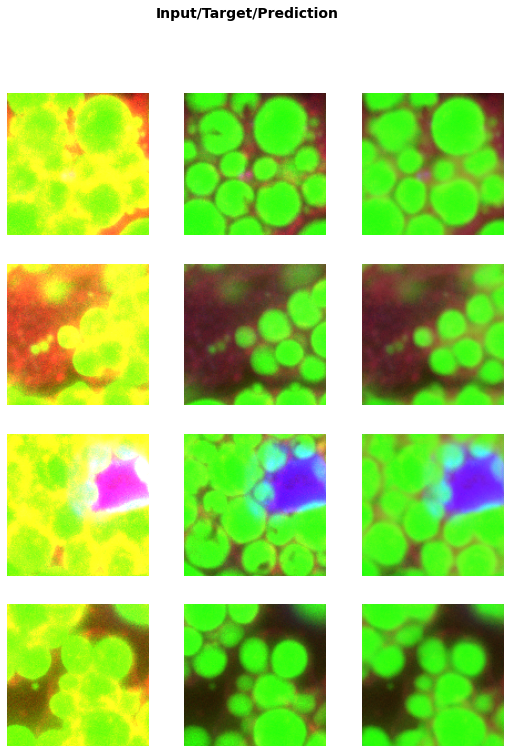

In [16]:
learn.show_results()

### Edgeloss

In [12]:
def get_gaussian_kernel(k=3, mu=0, sigma=1, normalize=True):
    # compute 1 dimension gaussian
    gaussian_1D = np.linspace(-1, 1, k)
    # compute a grid distance from center
    x, y = np.meshgrid(gaussian_1D, gaussian_1D)
    distance = (x ** 2 + y ** 2) ** 0.5

    # compute the 2 dimension gaussian
    gaussian_2D = np.exp(-(distance - mu) ** 2 / (2 * sigma ** 2))
    gaussian_2D = gaussian_2D / (2 * np.pi *sigma **2)

    # normalize part (mathematically)
    if normalize:
        gaussian_2D = gaussian_2D / np.sum(gaussian_2D)
    return gaussian_2D

def get_sobel_kernel(k=3):
    # get range
    range = np.linspace(-(k // 2), k // 2, k)
    # compute a grid the numerator and the axis-distances
    x, y = np.meshgrid(range, range)
    sobel_2D_numerator = x
    sobel_2D_denominator = (x ** 2 + y ** 2)
    sobel_2D_denominator[:, k // 2] = 1  # avoid division by zero
    sobel_2D = sobel_2D_numerator / sobel_2D_denominator
    return sobel_2D

def get_thin_kernels(start=0, end=360, step=45):
        k_thin = 3  # actual size of the directional kernel
        # increase for a while to avoid interpolation when rotating
        k_increased = k_thin + 2

        # get 0° angle directional kernel
        thin_kernel_0 = np.zeros((k_increased, k_increased))
        thin_kernel_0[k_increased // 2, k_increased // 2] = 1
        thin_kernel_0[k_increased // 2, k_increased // 2 + 1:] = -1

        # rotate the 0° angle directional kernel to get the other ones
        thin_kernels = []
        for angle in range(start, end, step):
            (h, w) = thin_kernel_0.shape
            # get the center to not rotate around the (0, 0) coord point
            center = (w // 2, h // 2)
            # apply rotation
            rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1)
            kernel_angle_increased = cv2.warpAffine(thin_kernel_0, rotation_matrix, (w, h), cv2.INTER_NEAREST)

            # get the k=3 kerne
            kernel_angle = kernel_angle_increased[1:-1, 1:-1]
            is_diag = (abs(kernel_angle) == 1)      # because of the interpolation
            kernel_angle = kernel_angle * is_diag   # because of the interpolation
            thin_kernels.append(kernel_angle)
        return thin_kernels

class CannyFilter(nn.Module):
    def __init__(self,
                 k_gaussian=3,
                 mu=0,
                 sigma=1,
                 k_sobel=3,
                 use_cuda=True):
        super(CannyFilter, self).__init__()
        # device
        self.device = 'cuda' if use_cuda else 'cpu'

        # gaussian

        gaussian_2D = get_gaussian_kernel(k_gaussian, mu, sigma)
        self.gaussian_filter = nn.Conv2d(in_channels=1,
                                         out_channels=1,
                                         kernel_size=k_gaussian,
                                         padding=k_gaussian // 2,
                                         bias=False).to(self.device)
        with torch.no_grad():
            self.gaussian_filter.weight[:] = torch.from_numpy(gaussian_2D).to(self.device)
        self.gaussian_filter.requires_grad=False

        # sobel

        sobel_2D = get_sobel_kernel(k_sobel)
        self.sobel_filter_x = nn.Conv2d(in_channels=1,
                                        out_channels=1,
                                        kernel_size=k_sobel,
                                        padding=k_sobel // 2,
                                        bias=False).to(self.device)
        with torch.no_grad():
            self.sobel_filter_x.weight[:] = torch.from_numpy(sobel_2D).to(self.device)
        self.sobel_filter_x.requires_grad=False


        self.sobel_filter_y = nn.Conv2d(in_channels=1,
                                        out_channels=1,
                                        kernel_size=k_sobel,
                                        padding=k_sobel // 2,
                                        bias=False).to(self.device)
        with torch.no_grad():
            self.sobel_filter_y.weight[:] = torch.from_numpy(sobel_2D.T).to(self.device)
        self.sobel_filter_y.requires_grad=False


        # thin

        thin_kernels = get_thin_kernels()
        directional_kernels = np.stack(thin_kernels)

        self.directional_filter = nn.Conv2d(in_channels=1,
                                            out_channels=8,
                                            kernel_size=thin_kernels[0].shape,
                                            padding=thin_kernels[0].shape[-1] // 2,
                                            bias=False).to(self.device)
        with torch.no_grad():
            self.directional_filter.weight[:, 0] = torch.from_numpy(directional_kernels).to(self.device)
        self.directional_filter.requires_grad=False

        # hysteresis

        hysteresis = np.ones((3, 3)) + 0.25
        self.hysteresis = nn.Conv2d(in_channels=1,
                                    out_channels=1,
                                    kernel_size=3,
                                    padding=1,
                                    bias=False).to(self.device)
        with torch.no_grad():
            self.hysteresis.weight[:] = torch.from_numpy(hysteresis).to(self.device)
        self.hysteresis.requires_grad=False


    def forward(self, img, low_threshold=None, high_threshold=None, hysteresis=False):
        # set the setps tensors
        B, C, H, W = img.shape
        blurred = torch.zeros((B, C, H, W), requires_grad=False).to(self.device)
        grad_x = torch.zeros((B, 1, H, W), requires_grad=False).to(self.device)
        grad_y = torch.zeros((B, 1, H, W), requires_grad=False).to(self.device)
        grad_magnitude = torch.zeros((B, 1, H, W), requires_grad=False).to(self.device)
        grad_orientation = torch.zeros((B, 1, H, W), requires_grad=False).to(self.device)

        # gaussian

        for c in range(C):
            blurred[:, c:c+1] = self.gaussian_filter(img[:, c:c+1])

            grad_x = grad_x + self.sobel_filter_x(blurred[:, c:c+1])
            grad_y = grad_y + self.sobel_filter_y(blurred[:, c:c+1])

        # thick edges

        grad_x, grad_y = grad_x / C, grad_y / C
        grad_magnitude = (grad_x ** 2 + grad_y ** 2) ** 0.5
        grad_orientation = torch.atan(grad_y / grad_x)
        grad_orientation = grad_orientation * (360 / np.pi) + 180 # convert to degree
        grad_orientation = torch.round(grad_orientation / 45) * 45  # keep a split by 45

        # thin edges

        directional = self.directional_filter(grad_magnitude)
        # get indices of positive and negative directions
        positive_idx = (grad_orientation / 45) % 8
        negative_idx = ((grad_orientation / 45) + 4) % 8
        thin_edges = grad_magnitude.clone()
        # non maximum suppression direction by direction
        for pos_i in range(4):
            neg_i = pos_i + 4
            # get the oriented grad for the angle
            is_oriented_i = (positive_idx == pos_i) * 1
            is_oriented_i = is_oriented_i + (positive_idx == neg_i) * 1
            pos_directional = directional[:, pos_i]
            neg_directional = directional[:, neg_i]
            selected_direction = torch.stack([pos_directional, neg_directional])

            # get the local maximum pixels for the angle
            is_max = selected_direction.min(dim=0)[0] > 0.0
            is_max = torch.unsqueeze(is_max, dim=1)

            # apply non maximum suppression
            to_remove = (is_max == 0) * 1 * (is_oriented_i) > 0
            thin_edges[to_remove] = 0.0

        # thresholds

        if low_threshold is not None:
            low = thin_edges > low_threshold

            if high_threshold is not None:
                high = thin_edges > high_threshold
                # get black/gray/white only
                thin_edges = low * 0.5 + high * 0.5

                if hysteresis:
                    # get weaks and check if they are high or not
                    weak = (thin_edges == 0.5) * 1
                    weak_is_high = (self.hysteresis(thin_edges) > 1) * weak
                    thin_edges = high * 1 + weak_is_high * 1
            else:
                thin_edges = low * 1


        return blurred, grad_x, grad_y, grad_magnitude, grad_orientation, thin_edges


In [11]:
canny = CannyFilter(k_gaussian=3)

In [14]:
blurred, grad_x, grad_y, grad_magnitude, grad_orientation, thin_edges = canny(
    ys[0].view(1,3,128,128),
    low_threshold=0.04,
    high_threshold=0.05,
)

<AxesSubplot:>

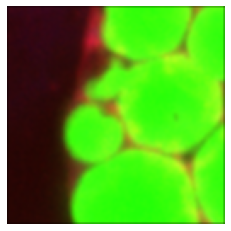

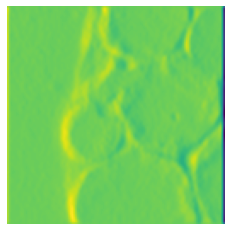

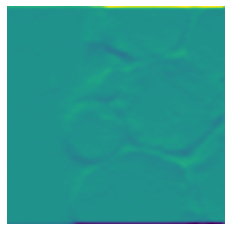

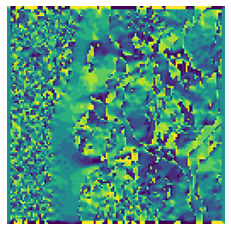

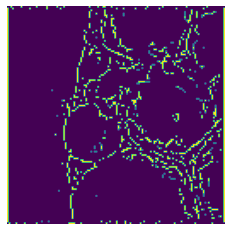

In [15]:
#print(blurred.shape)
TensorImage(blurred[0]).show()
TensorImage(grad_x[0]).show()
TensorImage(grad_y[0]).show()
TensorImage(grad_orientation[0]).show()
TensorImage(thin_edges[0]).show()

In [13]:
class EdgeLoss(torch.nn.Module):
    def __init__(self):
        super(EdgeLoss, self).__init__()
        self.canny = CannyFilter(k_gaussian=3)
        self.mse = MSELossFlat(axis=1)
        self.percloss = VGGPerceptualLoss()

    def forward(self, input, target):
        percloss = self.percloss(input, target)
        #mse_loss = self.mse(input, target)
        low_threshold=0.04
        high_threshold=0.05
        
        # returns: blurred, grad_x, grad_y, grad_magnitude, grad_orientation, thin_edges
        _,input_x,input_y,_,_,input_canny = self.canny(input, low_threshold=low_threshold, high_threshold=high_threshold)
        _,target_x,target_y,_,_,target_canny = self.canny(target, low_threshold=low_threshold, high_threshold=high_threshold)
        #edge_loss = self.mse(input_canny, target_canny)
        edge_loss = self.percloss(input_canny, target_canny)
        #edge_loss = self.mse(input_x, target_x) + self.mse(input_y, target_y)
        
        #print(mse_loss, edge_loss)
        
        loss = 2 * edge_loss + percloss
        #loss = edge_loss
        return loss

In [14]:
learn = unet_learner(
    dls, 
    models.resnet34, 
    n_out=3, 
    loss_func=EdgeLoss()
)

SuggestedLRs(lr_min=0.001096478197723627, lr_steep=0.005248074419796467)

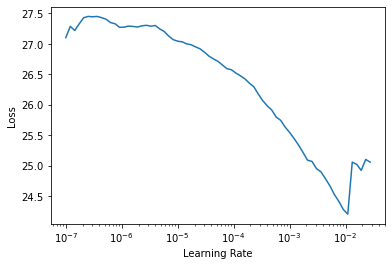

In [15]:
learn.lr_find()

In [16]:
learn.fine_tune(8, base_lr=1e-3)

epoch,train_loss,valid_loss,time
0,22.912582,20.344963,00:22


epoch,train_loss,valid_loss,time
0,19.575907,18.903652,00:26
1,18.849613,17.831184,00:26
2,18.164043,17.291330,00:25
3,17.497663,16.550739,00:25
4,16.893696,16.232468,00:25
5,16.336432,15.938348,00:25
6,15.906905,15.789096,00:25
7,15.582451,15.767463,00:25


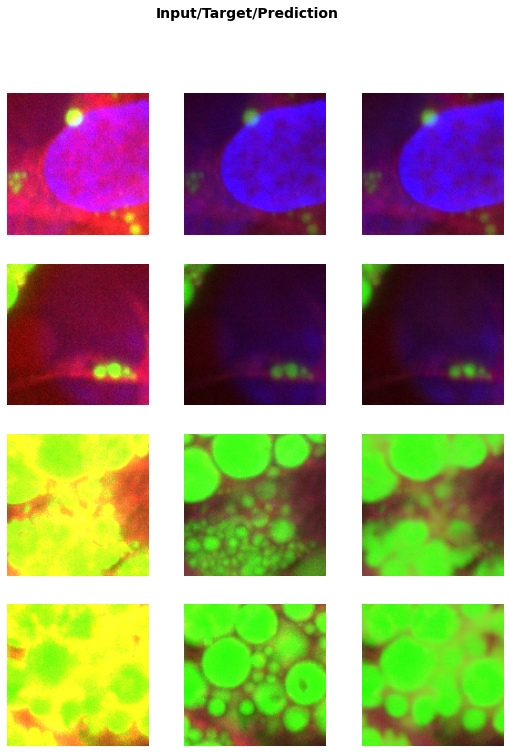

In [17]:
learn.show_results()

In [18]:
learn.fit_flat_cos(10, lr=1e-4)

epoch,train_loss,valid_loss,time
0,15.434943,15.775008,00:26
1,15.144017,15.713937,00:26
2,14.954577,15.791111,00:26
3,14.736138,15.726883,00:25
4,14.511463,15.566401,00:25
5,14.329268,15.585626,00:25
6,14.149798,15.606311,00:25
7,13.967446,15.563587,00:25
8,13.773758,15.486106,00:25
9,13.621773,15.440980,00:25


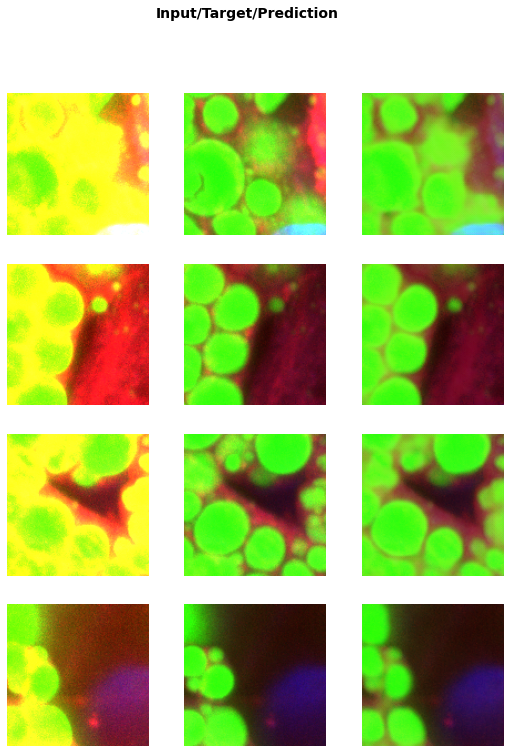

In [19]:
learn.show_results()

### Improving the perceptual loss

More models for feature comparison

In [10]:
import torch
import torchvision

class MultiPerceptualLoss(torch.nn.Module):
    def __init__(self, resize=True):
        super(MultiPerceptualLoss, self).__init__()
        blocks = []
        vgg16 = torchvision.models.vgg16(pretrained=True)
        blocks.append(vgg16.features[:4].eval())
        blocks.append(vgg16.features[4:9].eval())
        blocks.append(vgg16.features[9:16].eval())
        blocks.append(vgg16.features[16:23].eval())
        for bl in blocks:
            for p in bl:
                p.requires_grad = False
        self.blocks = torch.nn.ModuleList(blocks).cuda()
        
        blocks2 = []
        dn121 = torchvision.models.densenet121(pretrained=True)
        blocks2.append(dn121.features[:4].eval())
        blocks2.append(dn121.features[4:5].eval())
        blocks2.append(dn121.features[5:6].eval())
        blocks2.append(dn121.features[6:7].eval())
        for bl in blocks2:
            for p in bl:
                p.requires_grad = False
        self.blocks2 = torch.nn.ModuleList(blocks2).cuda()
        
        
        self.transform = torch.nn.functional.interpolate
        self.mean = torch.nn.Parameter(torch.tensor([0.485, 0.456, 0.406]).view(1,3,1,1)).cuda()
        self.std = torch.nn.Parameter(torch.tensor([0.229, 0.224, 0.225]).view(1,3,1,1)).cuda()
        self.resize = resize

    def forward(self, input, target):
        if input.shape[1] != 3:
            input = input.repeat(1, 3, 1, 1)
            target = target.repeat(1, 3, 1, 1)
        input = (input-self.mean) / self.std
        target = (target-self.mean) / self.std
        if self.resize:
            input = self.transform(input, mode='bilinear', size=(224, 224), align_corners=False)
            target = self.transform(target, mode='bilinear', size=(224, 224), align_corners=False)
        loss = 0.0
        
        x = input
        y = target
        for block in self.blocks:
            x = block(x)
            y = block(y)
            loss += torch.nn.functional.l1_loss(x, y)
            
        x = input
        y = target
        for block in self.blocks2:
            x = block(x)
            y = block(y)
            loss += torch.nn.functional.l1_loss(x, y)
        
        return loss

In [11]:
learn = unet_learner(
    dls, 
    models.resnet34, 
    n_out=3, 
    loss_func=MultiPerceptualLoss()
)

SuggestedLRs(lr_min=0.002754228748381138, lr_steep=0.0008317637839354575)

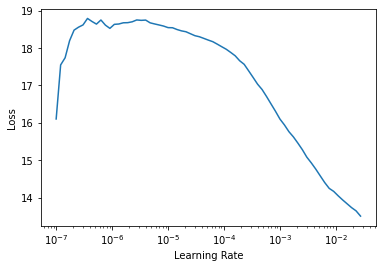

In [12]:
learn.lr_find()

In [13]:
learn.fine_tune(8, base_lr=1e-3)

epoch,train_loss,valid_loss,time
0,10.352868,8.247326,00:18


epoch,train_loss,valid_loss,time
0,6.917056,6.145440,00:19
1,6.369191,5.518150,00:19
2,5.936831,5.353986,00:19
3,5.613348,5.186485,00:19
4,5.248266,4.760256,00:19
5,4.843433,4.702498,00:19
6,4.513966,4.666225,00:19
7,4.313765,4.655543,00:19


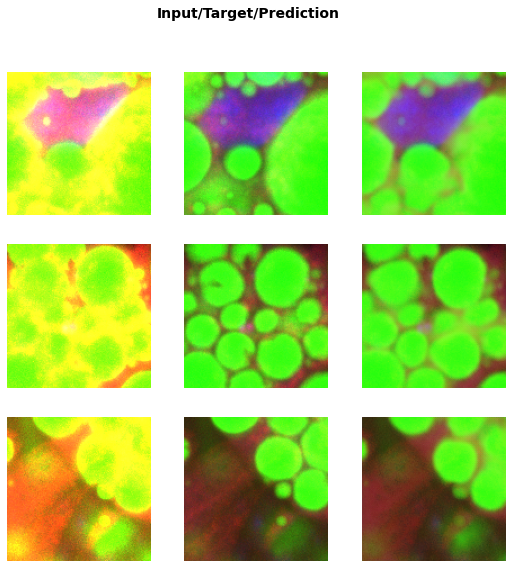

In [14]:
learn.show_results()

In [15]:
learn.fit_flat_cos(10, lr=1e-4)

epoch,train_loss,valid_loss,time
0,4.191731,4.728843,00:19
1,4.072605,4.657769,00:19
2,4.031239,4.727150,00:19
3,3.911896,4.699811,00:19
4,3.760805,4.654377,00:19
5,3.667789,4.738626,00:19
6,3.573052,4.621319,00:19
7,3.489583,4.690442,00:19
8,3.426429,4.629162,00:19
9,3.282738,4.656913,00:19


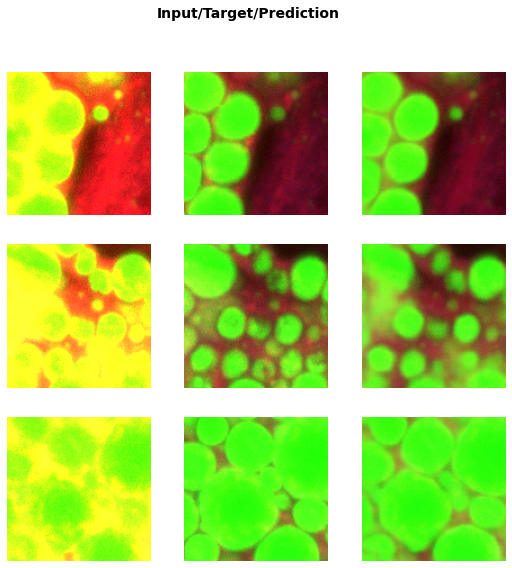

In [16]:
learn.show_results()